# Rhythm regularity and self similarity

### George Tzanetakis, University of Victoria

In this notebook we will look into how regularity and self-similarity can be used to detect different levels of rhythm periodicities. We will use Music21 and tinynotation to create some simple example illustrating these concepts.

In [11]:
!sudo apt install -y fluidsynth

Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
The following additional packages will be installed:
  fluid-soundfont-gm libfluidsynth3 libinstpatch-1.0-2 qsynth
Suggested packages:
  fluid-soundfont-gs jackd
The following NEW packages will be installed:
  fluid-soundfont-gm fluidsynth libfluidsynth3 libinstpatch-1.0-2 qsynth
0 upgraded, 5 newly installed, 0 to remove and 35 not upgraded.
Need to get 130 MB of archives.
After this operation, 151 MB of additional disk space will be used.
Get:1 http://archive.ubuntu.com/ubuntu jammy/universe amd64 fluid-soundfont-gm all 3.1-5.3 [130 MB]
Get:2 http://archive.ubuntu.com/ubuntu jammy/universe amd64 libinstpatch-1.0-2 amd64 1.1.6-1 [240 kB]
Get:3 http://archive.ubuntu.com/ubuntu jammy/universe amd64 libfluidsynth3 amd64 2.2.5-1 [246 kB]
Get:4 http://archive.ubuntu.com/ubuntu jammy/universe amd64 fluidsynth amd64 2.2.5-1 [27.4 kB]
Get:5 http://archive.ubuntu.com/ubuntu jammy/universe amd64 qsy

In [1]:
# Add the stable MuseScore PPA
!add-apt-repository ppa:mscore-ubuntu/mscore3-stable -y
# Update repositories
!apt-get update
# Install MuseScore 3
!apt-get install musescore3 -y




Repository: 'deb https://ppa.launchpadcontent.net/mscore-ubuntu/mscore3-stable/ubuntu/ jammy main'
Description:
~~~~~~~~~ MUSESCORE 3 RELEASES FOR UBUNTU 18.04 AND LATER ~~~~~~~~~
Note that Canonical doesn’t allow new builds for releases marked obsolete
(any nōn-LTS predating the previous LTS (currently 24.04 “noble”), and any LTS
older than 7 years, currently anything before 14.04 “trusty”). The packages
for those older releases here can no longer be updated but still work, within
limitations. Best to upgrade to a supported release of the operating system!

INSTALLING: (run these commands from the terminal)
  sudo add-apt-repository ppa:mscore-ubuntu/mscore3-stable
  sudo apt-get update
  sudo apt-get install musescore3

DO *NOT* USE THESE PPAs on Debian, only on Ubuntu!

‣‣‣ These packages are NOT suitable for ”KDE neon 18.04 (bionic)”!
‣ Use https://build.opensuse.org/project/show/home:mirabile:mscore instead.
⚠ KDE neon 18.04 was discontinued so those packages can no longer be upda

In [14]:
!pip install --upgrade pyfluidsynth
!pip install --upgrade midi2audio

  Using cached midi2audio-0.1.1-py2.py3-none-any.whl.metadata (5.7 kB)


In [15]:
%pip install pygame


In [23]:
import music21 as m21
from music21 import *
from midi2audio import FluidSynth
from IPython.display import Audio, display


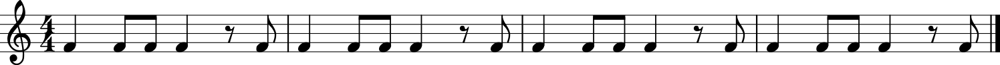

In [36]:
import music21 as m21
from music21 import *
from IPython.display import Audio

# Removed: %pip install --upgrade --force-reinstall pygame as it did not resolve the core issue.

stream1 = m21.converter.parse("""tinynotation: 4/4 f4 f8 f8 f4 r8 f8 f4 f8 f8 f4 r8 f8
                              f4 f8 f8 f4 r8 f8 f4 f8 f8 f4 r8 f8""")
stream1.show()

# Instead of using midi.realtime.StreamPlayer, save to MIDI and play.
midi_file = stream1.write('midi', fp='temp_stream1.mid')

def midi2audio(midi_file, audio_file):
  # Specify the soundfont file path (the one we installed earlier)
  sound_font = '/usr/share/sounds/sf2/FluidR3_GM.sf2'
  # Specify the output WAV filename
  wav_filename = 'output.wav'
  # Convert MIDI to WAV
  FluidSynth(sound_font).midi_to_audio(midi_file, audio_file)

audio_file = "output.wav"
midi2audio(midi_file, audio_file)
# Display the audio player in Colab
display(Audio(wav_filename))


Even though there are notes of different durations and rests many of the note onsets coincide with the onsets of a regular sequence of notes. For example lets hear a sequence of quarter notes - listen to how many of the onsets coincide. We can leverage this regularity to design algorithm for tempo estimation and beat tracking.

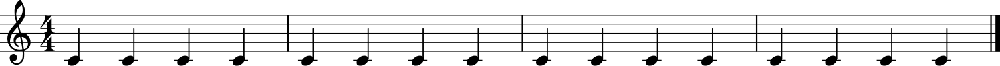

In [39]:
stream2 = m21.converter.parse("tinynotation: 4/4 c4 c c c c c c c c c c c c c c c")
s = stream.Score(id='mainScore')
#s.insert(stream1)
s.insert(stream2)
s.show()


# Instead of using midi.realtime.StreamPlayer, save to MIDI and play.
midi_file2 = s.write('midi', fp='temp_stream2.mid')
midi2audio(midi_file2, audio_file)
# Display the audio player in Colab
display(Audio(audio_file))


Using a regular sequence of eighth notes also show regularity in relation to our rhythm.

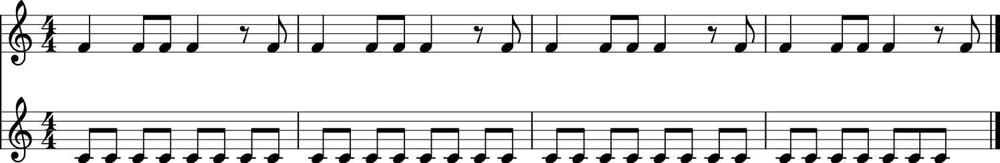

In [40]:
stream2 = m21.converter.parse("tinynotation: 4/4 c8 c c c c c c c c c c c c c c c c c c c c c c c c c c c c c c")
s = stream.Score(id='mainScore')
s.insert(stream1)
s.insert(stream2)
s.show()

# Instead of using midi.realtime.StreamPlayer, save to MIDI and play.
midi_file2 = s.write('midi', fp='temp_stream2.mid')
midi2audio(midi_file2, audio_file)
# Display the audio player in Colab
display(Audio(audio_file))



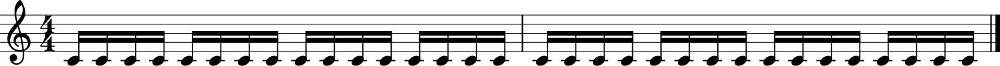

In [42]:
stream2 = m21.converter.parse("tinynotation: 4/4 c16 c c c c c c c c c c c c c c c c c c c c c c c c c c c c c c c")
s = stream.Score(id='mainScore')
s.insert(stream2)
s.show()

# Instead of using midi.realtime.StreamPlayer, save to MIDI and play.
midi_file = s.write('midi', fp='temp_stream4.mid')
wav_file_name = midi2audio(midi_file, audio_file)
# Display the audio player in Colab
display(Audio(audio_file))




Finally we can observer that there is a pattern (1 quarter note, 2 eighth notes, 1 quarter note, 1 eighth note rest, 1 eight note). By using a periodicity detection approach based on self similarity such as autocorrelation we would be able to detect this unit as a repeating pattern and the detected periodicity could inform tempo estimation and beat tracking algorithms.

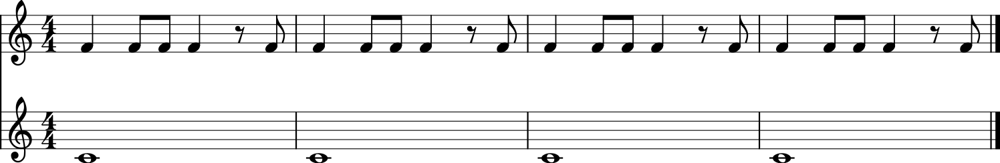

In [44]:
stream2 = m21.converter.parse("tinynotation: 4/4 c1 c c c")
s = stream.Score(id='mainScore')
s.insert(stream1)
s.insert(stream2)
s.show()

# Instead of using midi.realtime.StreamPlayer, save to MIDI and play.
midi_file2 = s.write('midi', fp='temp_stream2.mid')
midi2audio(midi_file2, audio_file)
# Display the audio player in Colab
display(Audio(audio_file))


Notice that self similarity could give us the same periodicity but at a different "phase" for example starting at the second beat of the first measure.

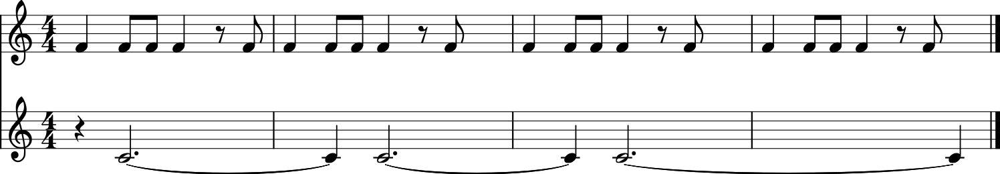

In [46]:
stream2 = m21.converter.parse("tinynotation: 4/4 r c1 c c ")
s = stream.Score(id='mainScore')
s.insert(stream1)
s.insert(stream2)
s.show()


# Instead of using midi.realtime.StreamPlayer, save to MIDI and play.
midi_file2 = s.write('midi', fp='temp_stream2.mid')
midi2audio(midi_file2, audio_file)
# Display the audio player in Colab
display(Audio(audio_file))


So to summarize we have looked at a few simple examples of how the ideas of regularity and self similarity manifest in rhythm. Tempo estimation and beat tracking algorithm typically leverage either regularity or self similarity or both.